# RAAS 24.05.13

In [1]:
import os, sys
import numpy as np
import scanpy as sc
import pandas as pd
import tables
import numpy as np
import scipy.sparse as sp
import matplotlib.pyplot as plt
import csv
from scipy.stats import median_abs_deviation
from typing import Dict
from collections import defaultdict, Counter, OrderedDict
from matplotlib import rcParams
from reportlab.lib.pagesizes import letter
from reportlab.platypus import SimpleDocTemplate, Image, Spacer, Paragraph
from reportlab.lib.styles import ParagraphStyle

import scvi
scvi.settings.seed=42

import torch
print('__Python VERSION:', sys.version)
print('__pyTorch VERSION:', torch.__version__)
print()
from subprocess import call
call(["nvidia-smi", "--format=csv", "--query-gpu=index,name,driver_version,memory.total,memory.used,memory.free"])
print()
use_cuda = torch.cuda.is_available()
if use_cuda:
    print('__CUDNN VERSION:', torch.backends.cudnn.version())
    print('__Number of CUDA Devices:', torch.cuda.device_count())
    print('__CUDA Device Name:',torch.cuda.get_device_name(0))
    print('__CUDA Device Total Memory [GB]:',torch.cuda.get_device_properties(0).total_memory/1e9)
    print('__CUDA Current Device:', torch.cuda.current_device())

Seed set to 42


__Python VERSION: 3.11.8 | packaged by conda-forge | (main, Feb 16 2024, 20:53:32) [GCC 12.3.0]
__pyTorch VERSION: 2.2.2+cu121

index, name, driver_version, memory.total [MiB], memory.used [MiB], memory.free [MiB]
0, NVIDIA RTX A6000, 535.146.02, 49140 MiB, 3003 MiB, 45672 MiB
1, NVIDIA RTX A6000, 535.146.02, 49140 MiB, 5399 MiB, 43276 MiB

__CUDNN VERSION: 8902
__Number of CUDA Devices: 2
__CUDA Device Name: NVIDIA RTX A6000
__CUDA Device Total Memory [GB]: 51.041271808
__CUDA Current Device: 0


In [2]:
# Replace 'cellranger_output' with the path of the directory you want to start the search from
cellranger_output="/mnt/gmi-l1/_90.User_Data/Shared_SCAID/02.CellRanger_output/"
anndata_output="/mnt/gmi-l1/_90.User_Data/Shared_SCAID/03.AnnData/"
disease=sys.argv[1]      ### input SCAID Disease Code
cellbender_fpr=0.01      ### stick to default value=0.01
gpu_device=1             ### 0 or 1 for gmi-analysis03 check usage with nvidia-smi

# Check if sys.argv[1] is empty
if len(sys.argv) < 2 or not sys.argv[1]:
    print("Error: SCAID Disease code is not provided.")
    sys.exit(1)  # Exit with non-zero status indicating error

## Call Disease here for ipynb

In [3]:
disease="RAAS"

In [4]:
##### Definitions #####
def find_fpr_h5_files(directory, disease, fpr):
    h5_file_path_list = []
    for root, dirs, files in os.walk(directory):
        for file in files:
            if file.startswith(disease) and file.endswith(str(fpr) + "_filtered.h5"):
                h5_file_path_list.append(os.path.join(root, file))
    return h5_file_path_list

def split_and_join(string):
    parts = string.split("_")
    if len(parts) >= 2:
        return "_".join(parts[:2])
    else:
        return string

### All Credit to https://github.com/Teichlab/Pan_fetal_immune ###
def dict_from_h5(file: str) -> Dict[str, np.ndarray]:
    """Read in everything from an h5 file and put into a dictionary."""
    d = {}
    with tables.open_file(file) as f:
        # read in everything
        for array in f.walk_nodes("/", "Array"):
            d[array.name] = array.read()
    return d
    
def anndata_from_h5(file: str, analyzed_barcodes_only: bool = True) -> 'anndata.AnnData':
    """Load an output h5 file into an AnnData object for downstream work.
    Args:
        file: The h5 file
        analyzed_barcodes_only: False to load all barcodes, so that the size of
            the AnnData object will match the size of the input raw count matrix.
            True to load a limited set of barcodes: only those analyzed by the
            algorithm. This allows relevant latent variables to be loaded
            properly into adata.obs and adata.obsm, rather than adata.uns.
    Returns:
        adata: The anndata object, populated with inferred latent variables
            and metadata.
    """

    try:
        import anndata
    except ImportError:
        raise ImportError('The anndata package must be installed to use the '
                          'function anndata_from_h5()')

    d = dict_from_h5(file)
    X = sp.csc_matrix((d.pop('data'), d.pop('indices'), d.pop('indptr')),
                      shape=d.pop('shape')).transpose().tocsr()

    if analyzed_barcodes_only:
        if 'barcodes_analyzed_inds' in d.keys():
            X = X[d['barcodes_analyzed_inds'], :]
            d['barcodes'] = d['barcodes'][d['barcodes_analyzed_inds']]
        elif 'barcode_indices_for_latents' in d.keys():
            X = X[d['barcode_indices_for_latents'], :]
            d['barcodes'] = d['barcodes'][d['barcode_indices_for_latents']]
        else:
            print('Warning: analyzed_barcodes_only=True, but the key '
                  '"barcodes_analyzed_inds" or "barcode_indices_for_latents" '
                  'is missing from the h5 file. '
                  'Will output all barcodes, and proceed as if '
                  'analyzed_barcodes_only=False')

    # Construct the count matrix.
    adata = anndata.AnnData(X=X,
                            obs={'barcode': d.pop('barcodes').astype(str)},
                            var={'gene_name': (d.pop('gene_names') if 'gene_names' in d.keys()
                                               else d.pop('name')).astype(str)})
    adata.obs.set_index('barcode', inplace=True)
    adata.var.set_index('gene_name', inplace=True)

    # Add other information to the adata object in the appropriate slot.
    for key, value in d.items():
        try:
            value = np.asarray(value)
            if len(value.shape) == 0:
                adata.uns[key] = value
            elif value.shape[0] == X.shape[0]:
                if (len(value.shape) < 2) or (value.shape[1] < 2):
                    adata.obs[key] = value
                else:
                    adata.obsm[key] = value
            elif value.shape[0] == X.shape[1]:
                if value.dtype.name.startswith('bytes'):
                    adata.var[key] = value.astype(str)
                else:
                    adata.var[key] = value
            else:
                adata.uns[key] = value
        except Exception:
            print('Unable to load data into AnnData: ', key, value, type(value))

    if analyzed_barcodes_only:
        for col in adata.obs.columns[adata.obs.columns.str.startswith('barcodes_analyzed')
                                     | adata.obs.columns.str.startswith('barcode_indices')]:
            try:
                del adata.obs[col]
            except Exception:
                pass

    return adata

### MAD filtering
def is_outlier(adata, metric: str, nmads: int):
    M = adata.obs[metric]
    outlier = (M < np.median(M) - nmads * median_abs_deviation(M)) | (
        np.median(M) + nmads * median_abs_deviation(M) < M
    )
    return outlier

def timestamp():
    return datetime.now().strftime("20%y%m%d")

## Adapted from scjp module
def merge_matrix(ad, obskeys = None,use_raw = False,keep_only_mutual=False):
    '''merge matrix stored in ad
    ad: dictionary of anndata to merge
    obskeys: list to merge within anndata
    use_raw: if True, merge from .raw.X'''
    
    smp_list = list(ad.keys())
    obs_dict = defaultdict(list)
    obs_names = []
    
    for smp in smp_list:
        ad[smp].obs['name'] = smp
    
    if not obskeys:
        obskey_list = []
        obskeys = []
        for sample in smp_list:
            obskey_list.extend(list(ad[sample].obs.columns))
        for (obskey, number) in Counter(obskey_list).items():
            if number == len(smp_list):
                obskeys.append(obskey)
            else:
                if keep_only_mutual:
                    pass
                else:
                    for sample in smp_list:
                        if obskey not in ad[sample].obs.columns:
                            ad[sample].obs[obskey]='n/a'
                    obskeys.append(obskey)
                               
    for sample in smp_list:
        obs_names.extend(list(ad[sample].obs_names))
        for key in obskeys:   
            obs_dict[key].extend(list(ad[sample].obs[key]))
    
    from scipy.sparse import vstack
    if use_raw == True:
        stack = vstack([ad[x].raw.X for x in smp_list]) # stack data
        adata = sc.AnnData(stack, var = ad[smp_list[0]].raw.var)
    else:
        stack = vstack([ad[x].X for x in smp_list]) # stack data
        adata = sc.AnnData(stack, var = ad[smp_list[0]].var)
      
    adata.obs_names = obs_names
    print(len(adata))
    
    for obs_col in obs_dict:
        print(obs_col)
        adata.obs[obs_col] = obs_dict[obs_col]
    return adata

In [5]:
### list of cellbender output file paths
h5_file_paths = sorted(find_fpr_h5_files(cellranger_output, disease, cellbender_fpr))
### list of cellbender output files
h5_file_names = [os.path.basename(path) for path in h5_file_paths]
### list of sample ids
sample_ids = [split_and_join(sample_id) for sample_id in h5_file_names]

In [6]:
df = pd.DataFrame({'SampleID': sample_ids, 'h5_file_names': h5_file_names, 'h5_file_paths': h5_file_paths})
df

,SampleID,h5_file_names,h5_file_paths
0,RAAS_B0001a-S0002a-S0003a,RAAS_B0001a-S0002a-S0003a_5GVS_cellbender_outp...,/mnt/gmi-l1/_90.User_Data/Shared_SCAID/02.Cell...
1,RAAS_B0003a-S0008a-S0006a,RAAS_B0003a-S0008a-S0006a_5GVS_cellbender_outp...,/mnt/gmi-l1/_90.User_Data/Shared_SCAID/02.Cell...
2,RAAS_B0004a-S0005a-S0001a,RAAS_B0004a-S0005a-S0001a_5GVS_cellbender_outp...,/mnt/gmi-l1/_90.User_Data/Shared_SCAID/02.Cell...
3,RAAS_B0006a-S0007a-S0004a,RAAS_B0006a-S0007a-S0004a_5GVS_cellbender_outp...,/mnt/gmi-l1/_90.User_Data/Shared_SCAID/02.Cell...
4,RAAS_B0006a-S0007a-S0004a,RAAS_B0006a-S0007a-S0004a_5GVS_expectedcells_c...,/mnt/gmi-l1/_90.User_Data/Shared_SCAID/02.Cell...
5,RAAS_B0015a-B0016a-B0017a,RAAS_B0015a-B0016a-B0017a_5GTS_cellbender_outp...,/mnt/gmi-l1/_90.User_Data/Shared_SCAID/02.Cell...
6,RAAS_B0018a-B0019a-B0020a,RAAS_B0018a-B0019a-B0020a_5GTS_cellbender_outp...,/mnt/gmi-l1/_90.User_Data/Shared_SCAID/02.Cell...
7,RAAS_S0009a-S0010a-S0011a,RAAS_S0009a-S0010a-S0011a_5GTS_cellbender_outp...,/mnt/gmi-l1/_90.User_Data/Shared_SCAID/02.Cell...
8,RAAS_S0012a-S0013a-S0014a,RAAS_S0012a-S0013a-S0014a_5GTS_cellbender_outp...,/mnt/gmi-l1/_90.User_Data/Shared_SCAID/02.Cell...
9,RAAS_S0015a-S0016a-S0017a,RAAS_S0015a-S0016a-S0017a_5GTS_cellbender_outp...,/mnt/gmi-l1/_90.User_Data/Shared_SCAID/02.Cell...


In [7]:
# Indices of h5 file to remove
indices_to_remove = [3]

# Updated list after removing elements at specified indices
h5_file_paths = [x for i, x in enumerate(h5_file_paths) if i not in indices_to_remove]
h5_file_names = [x for i, x in enumerate(h5_file_names) if i not in indices_to_remove]
sample_ids = [x for i, x in enumerate(sample_ids) if i not in indices_to_remove]

In [8]:
h5_file_names

['RAAS_B0001a-S0002a-S0003a_5GVS_cellbender_output_FPR_0.01_filtered.h5',
 'RAAS_B0003a-S0008a-S0006a_5GVS_cellbender_output_FPR_0.01_filtered.h5',
 'RAAS_B0004a-S0005a-S0001a_5GVS_cellbender_output_FPR_0.01_filtered.h5',
 'RAAS_B0006a-S0007a-S0004a_5GVS_expectedcells_cellbender_output_FPR_0.01_filtered.h5',
 'RAAS_B0015a-B0016a-B0017a_5GTS_cellbender_output_FPR_0.01_filtered.h5',
 'RAAS_B0018a-B0019a-B0020a_5GTS_cellbender_output_FPR_0.01_filtered.h5',
 'RAAS_S0009a-S0010a-S0011a_5GTS_cellbender_output_FPR_0.01_filtered.h5',
 'RAAS_S0012a-S0013a-S0014a_5GTS_cellbender_output_FPR_0.01_filtered.h5',
 'RAAS_S0015a-S0016a-S0017a_5GTS_cellbender_output_FPR_0.01_filtered.h5',
 'RAAS_S0018a-S0019a-S0020a_5GTS_cellbender_output_FPR_0.01_filtered.h5']

In [9]:
### Read h5 files and create a dictionary of AnnData
adata_dict={}
for SampleID, H5Path in zip(sample_ids, h5_file_paths):
    adata_dict[SampleID] = anndata_from_h5(H5Path, analyzed_barcodes_only=False)

### Add sample_id to obs names & create 'Sample_ID' column
for sample in adata_dict:
    adata_dict[sample].obs_names = sample+"_"+adata_dict[sample].obs_names
    adata_dict[sample].obs['Sample_ID']=sample

In [10]:
h5_file_names

['RAAS_B0001a-S0002a-S0003a_5GVS_cellbender_output_FPR_0.01_filtered.h5',
 'RAAS_B0003a-S0008a-S0006a_5GVS_cellbender_output_FPR_0.01_filtered.h5',
 'RAAS_B0004a-S0005a-S0001a_5GVS_cellbender_output_FPR_0.01_filtered.h5',
 'RAAS_B0006a-S0007a-S0004a_5GVS_expectedcells_cellbender_output_FPR_0.01_filtered.h5',
 'RAAS_B0015a-B0016a-B0017a_5GTS_cellbender_output_FPR_0.01_filtered.h5',
 'RAAS_B0018a-B0019a-B0020a_5GTS_cellbender_output_FPR_0.01_filtered.h5',
 'RAAS_S0009a-S0010a-S0011a_5GTS_cellbender_output_FPR_0.01_filtered.h5',
 'RAAS_S0012a-S0013a-S0014a_5GTS_cellbender_output_FPR_0.01_filtered.h5',
 'RAAS_S0015a-S0016a-S0017a_5GTS_cellbender_output_FPR_0.01_filtered.h5',
 'RAAS_S0018a-S0019a-S0020a_5GTS_cellbender_output_FPR_0.01_filtered.h5']

In [11]:
h5_file_paths

['/mnt/gmi-l1/_90.User_Data/Shared_SCAID/02.CellRanger_output/RAAS_B0001a-S0002a-S0003a_5GVS/outs/multi/count/RAAS_B0001a-S0002a-S0003a_5GVS_cellbender_output_FPR_0.01_filtered.h5',
 '/mnt/gmi-l1/_90.User_Data/Shared_SCAID/02.CellRanger_output/RAAS_B0003a-S0008a-S0006a_5GVS/outs/multi/count/RAAS_B0003a-S0008a-S0006a_5GVS_cellbender_output_FPR_0.01_filtered.h5',
 '/mnt/gmi-l1/_90.User_Data/Shared_SCAID/02.CellRanger_output/RAAS_B0004a-S0005a-S0001a_5GVS/outs/multi/count/RAAS_B0004a-S0005a-S0001a_5GVS_cellbender_output_FPR_0.01_filtered.h5',
 '/mnt/gmi-l1/_90.User_Data/Shared_SCAID/02.CellRanger_output/RAAS_B0006a-S0007a-S0004a_5GVS/outs/multi/count/RAAS_B0006a-S0007a-S0004a_5GVS_expectedcells_cellbender_output_FPR_0.01_filtered.h5',
 '/mnt/gmi-l1/_90.User_Data/Shared_SCAID/02.CellRanger_output/RAAS_B0015a-B0016a-B0017a_5GTS/outs/multi/count/RAAS_B0015a-B0016a-B0017a_5GTS_cellbender_output_FPR_0.01_filtered.h5',
 '/mnt/gmi-l1/_90.User_Data/Shared_SCAID/02.CellRanger_output/RAAS_B0018a-B0

Seed set to 42
An NVIDIA GPU may be present on this machine, but a CUDA-enabled jaxlib is not installed. Falling back to cpu.
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
You are using a CUDA device ('NVIDIA RTX A6000') that has Tensor Cores. To properly utilize them, you should set `torch.set_float32_matmul_precision('medium' | 'high')` which will trade-off precision for performance. For more details, read https://pytorch.org/docs/stable/generated/torch.set_float32_matmul_precision.html#torch.set_float32_matmul_precision
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0,1]
/mnt/gmi-l1/_90.User_Data/sylash92/1.Programs/miniforge3/envs/preprocess/lib/python3.11/site-packages/lightning/pytorch/trainer/connectors/data_connector.py:441: The 'train_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=127` 

Epoch 400/400: 100%|█| 400/400 [11:02<00:00,  1.75s/it, v_num=1, train_loss_step

`Trainer.fit` stopped: `max_epochs=400` reached.


Epoch 400/400: 100%|█| 400/400 [11:02<00:00,  1.66s/it, v_num=1, train_loss_step
INFO     Creating doublets, preparing SOLO model.                                                                  


GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0,1]
/mnt/gmi-l1/_90.User_Data/sylash92/1.Programs/miniforge3/envs/preprocess/lib/python3.11/site-packages/lightning/pytorch/trainer/connectors/data_connector.py:441: The 'train_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=127` in the `DataLoader` to improve performance.
/mnt/gmi-l1/_90.User_Data/sylash92/1.Programs/miniforge3/envs/preprocess/lib/python3.11/site-packages/lightning/pytorch/trainer/connectors/data_connector.py:441: The 'val_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=127` in the `DataLoader` to improve performance.


Epoch 400/400: 100%|█| 400/400 [00:56<00:00, 10.86it/s, v_num=1, train_loss_step

`Trainer.fit` stopped: `max_epochs=400` reached.


Epoch 400/400: 100%|█| 400/400 [00:56<00:00,  7.03it/s, v_num=1, train_loss_step


/tmp/ipykernel_114108/3477886376.py:135: FutureWarning: In the future, the default backend for leiden will be igraph instead of leidenalg.

 To achieve the future defaults please pass: flavor="igraph" and n_iterations=2.  directed must also be False to work with igraph's implementation.
  sc.tl.leiden(adata_fig)
Seed set to 42
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0,1]
/mnt/gmi-l1/_90.User_Data/sylash92/1.Programs/miniforge3/envs/preprocess/lib/python3.11/site-packages/lightning/pytorch/trainer/connectors/data_connector.py:441: The 'train_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=127` in the `DataLoader` to improve performance.


Epoch 400/400: 100%|█| 400/400 [09:46<00:00,  1.67s/it, v_num=1, train_loss_step

`Trainer.fit` stopped: `max_epochs=400` reached.


Epoch 400/400: 100%|█| 400/400 [09:46<00:00,  1.47s/it, v_num=1, train_loss_step
INFO     Creating doublets, preparing SOLO model.                                                                  


GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0,1]
/mnt/gmi-l1/_90.User_Data/sylash92/1.Programs/miniforge3/envs/preprocess/lib/python3.11/site-packages/lightning/pytorch/trainer/connectors/data_connector.py:441: The 'train_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=127` in the `DataLoader` to improve performance.
/mnt/gmi-l1/_90.User_Data/sylash92/1.Programs/miniforge3/envs/preprocess/lib/python3.11/site-packages/lightning/pytorch/trainer/connectors/data_connector.py:441: The 'val_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=127` in the `DataLoader` to improve performance.


Epoch 400/400: 100%|█| 400/400 [00:53<00:00, 14.66it/s, v_num=1, train_loss_step

`Trainer.fit` stopped: `max_epochs=400` reached.


Epoch 400/400: 100%|█| 400/400 [00:53<00:00,  7.47it/s, v_num=1, train_loss_step


Seed set to 42
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0,1]
/mnt/gmi-l1/_90.User_Data/sylash92/1.Programs/miniforge3/envs/preprocess/lib/python3.11/site-packages/lightning/pytorch/trainer/connectors/data_connector.py:441: The 'train_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=127` in the `DataLoader` to improve performance.


Epoch 400/400: 100%|█| 400/400 [10:34<00:00,  1.46s/it, v_num=1, train_loss_step

`Trainer.fit` stopped: `max_epochs=400` reached.


Epoch 400/400: 100%|█| 400/400 [10:34<00:00,  1.59s/it, v_num=1, train_loss_step
INFO     Creating doublets, preparing SOLO model.                                                                  


GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0,1]
/mnt/gmi-l1/_90.User_Data/sylash92/1.Programs/miniforge3/envs/preprocess/lib/python3.11/site-packages/lightning/pytorch/trainer/connectors/data_connector.py:441: The 'train_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=127` in the `DataLoader` to improve performance.
/mnt/gmi-l1/_90.User_Data/sylash92/1.Programs/miniforge3/envs/preprocess/lib/python3.11/site-packages/lightning/pytorch/trainer/connectors/data_connector.py:441: The 'val_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=127` in the `DataLoader` to improve performance.


Epoch 297/400:  74%|▋| 297/400 [00:28<00:10, 10.28it/s, v_num=1, train_loss_step
Monitored metric validation_loss did not improve in the last 30 records. Best score: 0.239. Signaling Trainer to stop.


Seed set to 42
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0,1]
/mnt/gmi-l1/_90.User_Data/sylash92/1.Programs/miniforge3/envs/preprocess/lib/python3.11/site-packages/lightning/pytorch/trainer/connectors/data_connector.py:441: The 'train_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=127` in the `DataLoader` to improve performance.
/mnt/gmi-l1/_90.User_Data/sylash92/1.Programs/miniforge3/envs/preprocess/lib/python3.11/site-packages/lightning/pytorch/loops/fit_loop.py:293: The number of training batches (7) is smaller than the logging interval Trainer(log_every_n_steps=10). Set a lower value for log_every_n_steps if you want to see logs for the training epoch.


Epoch 400/400: 100%|█| 400/400 [03:00<00:00,  2.06it/s, v_num=1, train_loss_step

`Trainer.fit` stopped: `max_epochs=400` reached.


Epoch 400/400: 100%|█| 400/400 [03:00<00:00,  2.22it/s, v_num=1, train_loss_step
INFO     Creating doublets, preparing SOLO model.                                                                  


GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0,1]
/mnt/gmi-l1/_90.User_Data/sylash92/1.Programs/miniforge3/envs/preprocess/lib/python3.11/site-packages/lightning/pytorch/trainer/connectors/data_connector.py:441: The 'train_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=127` in the `DataLoader` to improve performance.
/mnt/gmi-l1/_90.User_Data/sylash92/1.Programs/miniforge3/envs/preprocess/lib/python3.11/site-packages/lightning/pytorch/trainer/connectors/data_connector.py:441: The 'val_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=127` in the `DataLoader` to improve performance.


Epoch 400/400: 100%|█| 400/400 [00:23<00:00, 19.53it/s, v_num=1, train_loss_step

`Trainer.fit` stopped: `max_epochs=400` reached.


Epoch 400/400: 100%|█| 400/400 [00:23<00:00, 17.24it/s, v_num=1, train_loss_step


/tmp/ipykernel_114108/3477886376.py:21: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig, axs = plt.subplots(
Seed set to 42
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0,1]
/mnt/gmi-l1/_90.User_Data/sylash92/1.Programs/miniforge3/envs/preprocess/lib/python3.11/site-packages/lightning/pytorch/trainer/connectors/data_connector.py:441: The 'train_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=127` in the `DataLoader` to improve performance.


Epoch 400/400: 100%|█| 400/400 [12:48<00:00,  3.30s/it, v_num=1, train_loss_step

`Trainer.fit` stopped: `max_epochs=400` reached.


Epoch 400/400: 100%|█| 400/400 [12:48<00:00,  1.92s/it, v_num=1, train_loss_step
INFO     Creating doublets, preparing SOLO model.                                                                  


GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0,1]
/mnt/gmi-l1/_90.User_Data/sylash92/1.Programs/miniforge3/envs/preprocess/lib/python3.11/site-packages/lightning/pytorch/trainer/connectors/data_connector.py:441: The 'train_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=127` in the `DataLoader` to improve performance.
/mnt/gmi-l1/_90.User_Data/sylash92/1.Programs/miniforge3/envs/preprocess/lib/python3.11/site-packages/lightning/pytorch/trainer/connectors/data_connector.py:441: The 'val_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=127` in the `DataLoader` to improve performance.


Epoch 305/400:  76%|▊| 305/400 [00:53<00:16,  5.66it/s, v_num=1, train_loss_step
Monitored metric validation_loss did not improve in the last 30 records. Best score: 0.211. Signaling Trainer to stop.


Seed set to 42
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0,1]
/mnt/gmi-l1/_90.User_Data/sylash92/1.Programs/miniforge3/envs/preprocess/lib/python3.11/site-packages/lightning/pytorch/trainer/connectors/data_connector.py:441: The 'train_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=127` in the `DataLoader` to improve performance.


Epoch 400/400: 100%|█| 400/400 [13:57<00:00,  1.94s/it, v_num=1, train_loss_step

`Trainer.fit` stopped: `max_epochs=400` reached.


Epoch 400/400: 100%|█| 400/400 [13:57<00:00,  2.09s/it, v_num=1, train_loss_step
INFO     Creating doublets, preparing SOLO model.                                                                  


GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0,1]
/mnt/gmi-l1/_90.User_Data/sylash92/1.Programs/miniforge3/envs/preprocess/lib/python3.11/site-packages/lightning/pytorch/trainer/connectors/data_connector.py:441: The 'train_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=127` in the `DataLoader` to improve performance.
/mnt/gmi-l1/_90.User_Data/sylash92/1.Programs/miniforge3/envs/preprocess/lib/python3.11/site-packages/lightning/pytorch/trainer/connectors/data_connector.py:441: The 'val_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=127` in the `DataLoader` to improve performance.


Epoch 376/400:  94%|▉| 376/400 [01:07<00:04,  5.56it/s, v_num=1, train_loss_step
Monitored metric validation_loss did not improve in the last 30 records. Best score: 0.285. Signaling Trainer to stop.


Seed set to 42
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0,1]
/mnt/gmi-l1/_90.User_Data/sylash92/1.Programs/miniforge3/envs/preprocess/lib/python3.11/site-packages/lightning/pytorch/trainer/connectors/data_connector.py:441: The 'train_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=127` in the `DataLoader` to improve performance.


Epoch 400/400: 100%|█| 400/400 [14:31<00:00,  2.15s/it, v_num=1, train_loss_step

`Trainer.fit` stopped: `max_epochs=400` reached.


Epoch 400/400: 100%|█| 400/400 [14:31<00:00,  2.18s/it, v_num=1, train_loss_step
INFO     Creating doublets, preparing SOLO model.                                                                  


GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0,1]
/mnt/gmi-l1/_90.User_Data/sylash92/1.Programs/miniforge3/envs/preprocess/lib/python3.11/site-packages/lightning/pytorch/trainer/connectors/data_connector.py:441: The 'train_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=127` in the `DataLoader` to improve performance.
/mnt/gmi-l1/_90.User_Data/sylash92/1.Programs/miniforge3/envs/preprocess/lib/python3.11/site-packages/lightning/pytorch/trainer/connectors/data_connector.py:441: The 'val_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=127` in the `DataLoader` to improve performance.


Epoch 378/400:  94%|▉| 378/400 [00:45<00:02,  8.39it/s, v_num=1, train_loss_step
Monitored metric validation_loss did not improve in the last 30 records. Best score: 0.332. Signaling Trainer to stop.


Seed set to 42
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0,1]
/mnt/gmi-l1/_90.User_Data/sylash92/1.Programs/miniforge3/envs/preprocess/lib/python3.11/site-packages/lightning/pytorch/trainer/connectors/data_connector.py:441: The 'train_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=127` in the `DataLoader` to improve performance.


Epoch 400/400: 100%|█| 400/400 [09:56<00:00,  1.48s/it, v_num=1, train_loss_step

`Trainer.fit` stopped: `max_epochs=400` reached.


Epoch 400/400: 100%|█| 400/400 [09:56<00:00,  1.49s/it, v_num=1, train_loss_step
INFO     Creating doublets, preparing SOLO model.                                                                  


GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0,1]
/mnt/gmi-l1/_90.User_Data/sylash92/1.Programs/miniforge3/envs/preprocess/lib/python3.11/site-packages/lightning/pytorch/trainer/connectors/data_connector.py:441: The 'train_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=127` in the `DataLoader` to improve performance.
/mnt/gmi-l1/_90.User_Data/sylash92/1.Programs/miniforge3/envs/preprocess/lib/python3.11/site-packages/lightning/pytorch/trainer/connectors/data_connector.py:441: The 'val_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=127` in the `DataLoader` to improve performance.


Epoch 400/400: 100%|█| 400/400 [00:35<00:00, 11.31it/s, v_num=1, train_loss_step

`Trainer.fit` stopped: `max_epochs=400` reached.


Epoch 400/400: 100%|█| 400/400 [00:35<00:00, 11.26it/s, v_num=1, train_loss_step


Seed set to 42
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0,1]
/mnt/gmi-l1/_90.User_Data/sylash92/1.Programs/miniforge3/envs/preprocess/lib/python3.11/site-packages/lightning/pytorch/trainer/connectors/data_connector.py:441: The 'train_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=127` in the `DataLoader` to improve performance.


Epoch 400/400: 100%|█| 400/400 [11:52<00:00,  1.71s/it, v_num=1, train_loss_step

`Trainer.fit` stopped: `max_epochs=400` reached.


Epoch 400/400: 100%|█| 400/400 [11:52<00:00,  1.78s/it, v_num=1, train_loss_step
INFO     Creating doublets, preparing SOLO model.                                                                  


GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0,1]
/mnt/gmi-l1/_90.User_Data/sylash92/1.Programs/miniforge3/envs/preprocess/lib/python3.11/site-packages/lightning/pytorch/trainer/connectors/data_connector.py:441: The 'train_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=127` in the `DataLoader` to improve performance.
/mnt/gmi-l1/_90.User_Data/sylash92/1.Programs/miniforge3/envs/preprocess/lib/python3.11/site-packages/lightning/pytorch/trainer/connectors/data_connector.py:441: The 'val_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=127` in the `DataLoader` to improve performance.


Epoch 357/400:  89%|▉| 357/400 [00:43<00:05,  8.29it/s, v_num=1, train_loss_step
Monitored metric validation_loss did not improve in the last 30 records. Best score: 0.265. Signaling Trainer to stop.


Seed set to 42
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0,1]
/mnt/gmi-l1/_90.User_Data/sylash92/1.Programs/miniforge3/envs/preprocess/lib/python3.11/site-packages/lightning/pytorch/trainer/connectors/data_connector.py:441: The 'train_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=127` in the `DataLoader` to improve performance.


Epoch 400/400: 100%|█| 400/400 [13:17<00:00,  2.27s/it, v_num=1, train_loss_step

`Trainer.fit` stopped: `max_epochs=400` reached.


Epoch 400/400: 100%|█| 400/400 [13:17<00:00,  1.99s/it, v_num=1, train_loss_step
INFO     Creating doublets, preparing SOLO model.                                                                  


GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0,1]
/mnt/gmi-l1/_90.User_Data/sylash92/1.Programs/miniforge3/envs/preprocess/lib/python3.11/site-packages/lightning/pytorch/trainer/connectors/data_connector.py:441: The 'train_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=127` in the `DataLoader` to improve performance.
/mnt/gmi-l1/_90.User_Data/sylash92/1.Programs/miniforge3/envs/preprocess/lib/python3.11/site-packages/lightning/pytorch/trainer/connectors/data_connector.py:441: The 'val_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=127` in the `DataLoader` to improve performance.


Epoch 205/400:  51%|▌| 205/400 [00:27<00:26,  7.42it/s, v_num=1, train_loss_step
Monitored metric validation_loss did not improve in the last 30 records. Best score: 0.316. Signaling Trainer to stop.


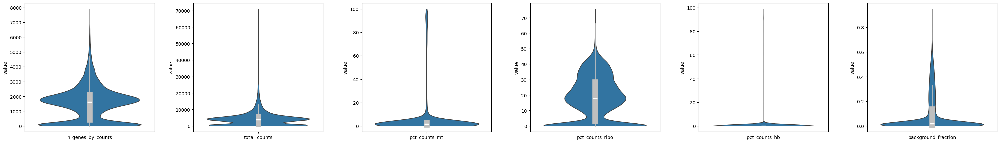

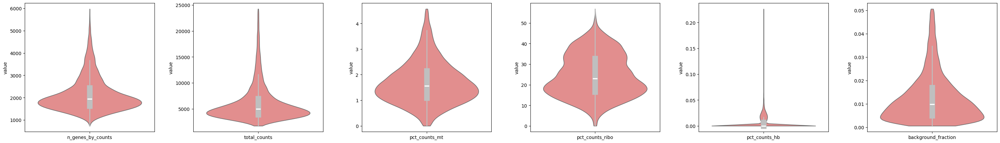

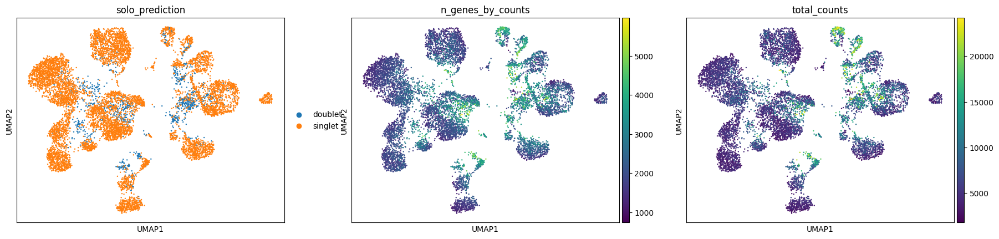

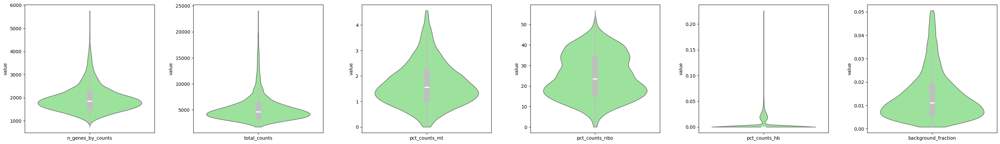

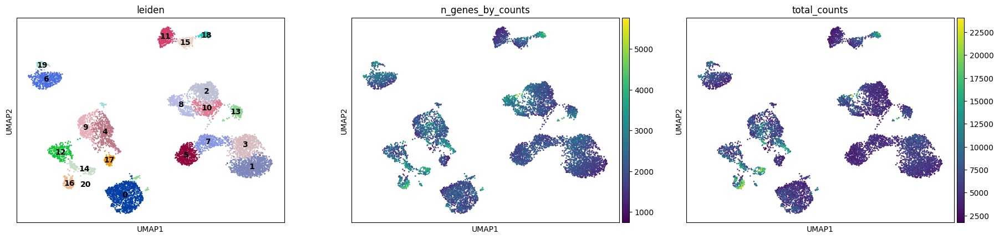

...

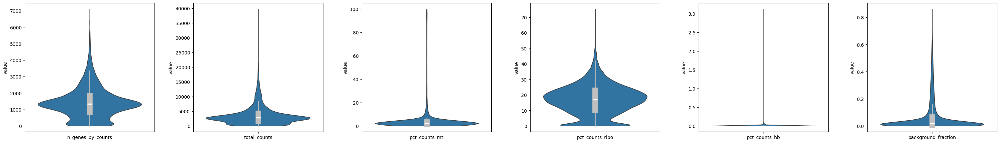

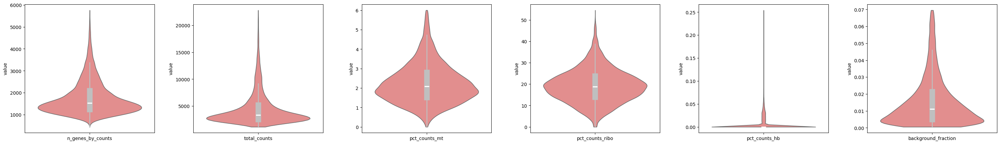

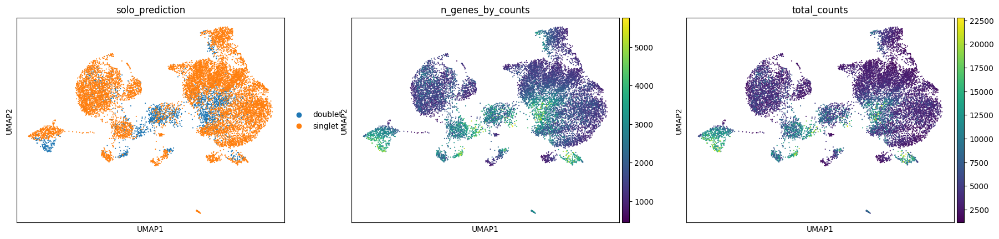

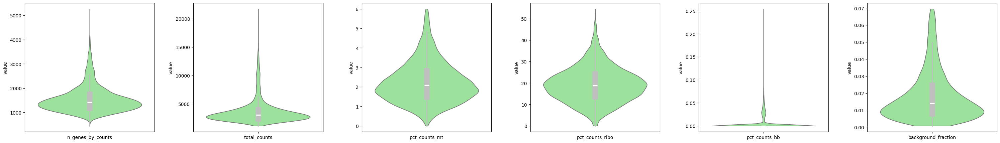

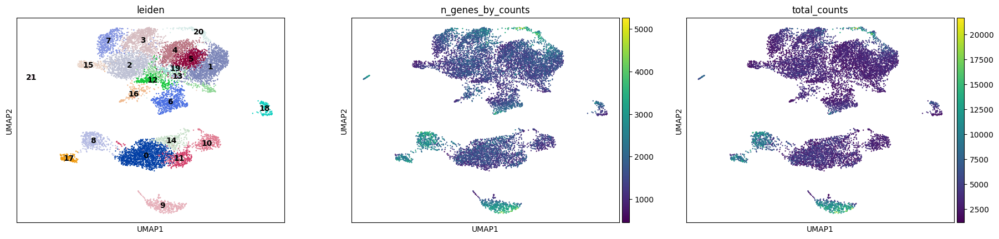

In [12]:
#### QC ####
for sample in sample_ids:
    ### Calculate QC Metrics
    adata_dict[sample].var_names_make_unique()
    adata_dict[sample].var['mt'] = adata_dict[sample].var_names.str.startswith('MT-')  
    adata_dict[sample].var['ribo'] = adata_dict[sample].var_names.str.startswith(("RPS", "RPL"))
    adata_dict[sample].var['hb'] = adata_dict[sample].var_names.str.contains(("^HB[^(P)]"))
    sc.pp.calculate_qc_metrics(adata_dict[sample], qc_vars=['mt', 'ribo', 'hb'], percent_top=[20], log1p=True, inplace=True)

    ###### Before filtering
    description_1 = f"Total number of cells from CellBender output: {adata_dict[sample].n_obs}"
    
    # Define matplotlib Axes
    # Number of Axes & plot size
    ncols = 6
    nrows = 1
    figsize = 5
    wspace = 0.3
    inner_kws=dict(box_width=12, whis_width=2, color=".75")

    fig, axs = plt.subplots(
        nrows=nrows,
        ncols=ncols,
        figsize=(ncols * figsize + figsize * wspace * (ncols - 1), nrows * figsize),
    )
    plt.subplots_adjust(wspace=wspace)
    sc.pl.violin(adata_dict[sample], ['n_genes_by_counts'], inner='box', stripplot=False, show=False, ax=axs[0], inner_kws=inner_kws)
    sc.pl.violin(adata_dict[sample], ['total_counts'],      inner='box', stripplot=False, show=False, ax=axs[1], inner_kws=inner_kws)
    sc.pl.violin(adata_dict[sample], ['pct_counts_mt'],     inner='box', stripplot=False, show=False, ax=axs[2], inner_kws=inner_kws)
    sc.pl.violin(adata_dict[sample], ['pct_counts_ribo'],   inner='box', stripplot=False, show=False, ax=axs[3], inner_kws=inner_kws)
    sc.pl.violin(adata_dict[sample], ['pct_counts_hb'],     inner='box', stripplot=False, show=False, ax=axs[4], inner_kws=inner_kws)
    sc.pl.violin(adata_dict[sample], ['background_fraction'], inner='box', stripplot=False, show=False, ax=axs[5], inner_kws=inner_kws)
    plt.savefig("{d}/preprocess_QC_figures/{s}_violin_1.png".format(d=anndata_output, s=sample).format(s=sample), dpi=150, bbox_inches='tight')
    
    ### Crude Filter - Filter out cells with less than 200 n_genes or more than 30% Mitochondrial genes
    sc.pp.filter_cells(adata_dict[sample], min_genes=200)
    text_1 = f"Number of cells after min_genes > 200: {adata_dict[sample].n_obs}"
    adata_dict[sample] = adata_dict[sample][adata_dict[sample].obs.pct_counts_hb < 1, :].copy()
    text_2 = f"Number of cells after filtering pct_counts_hb < 1: {adata_dict[sample].n_obs}"
    adata_dict[sample] = adata_dict[sample][adata_dict[sample].obs.pct_counts_mt < 30, :].copy()
    text_3 = f"Number of cells after filtering pct_counts_mt < 30: {adata_dict[sample].n_obs}"
    adata_dict[sample] = adata_dict[sample][adata_dict[sample].obs.total_counts < 30000, :].copy()
    text_4 = f"Number of cells after filtering total_counts < 30000: {adata_dict[sample].n_obs}"
    
    ### MAD Filter
    adata_dict[sample].obs["outlier"] = (
        is_outlier(adata_dict[sample], "log1p_total_counts", 5)
        | is_outlier(adata_dict[sample], "log1p_n_genes_by_counts", 5)
        | is_outlier(adata_dict[sample], "pct_counts_in_top_20_genes", 5)
        | is_outlier(adata_dict[sample], "background_fraction", 5)
    )
    adata_dict[sample].obs["mt_outlier"] = (
        is_outlier(adata_dict[sample], "pct_counts_mt", 5)
    )

    ### Actually do the filtering
    adata_dict[sample] = adata_dict[sample][(~adata_dict[sample].obs.outlier) & (~adata_dict[sample].obs.mt_outlier)].copy()

    ###### After MAD filtering
    text_5 = f"Number of cells after filtering out low quality cells with MAD: {adata_dict[sample].n_obs}"
    description_2 = f"{text_1}\n{text_2}\n{text_3}\n{text_4}\n{text_5}"
    
    # violin plot and scatter plot
    fig, axs = plt.subplots(
        nrows=nrows,
        ncols=ncols,
        figsize=(ncols * figsize + figsize * wspace * (ncols - 1), nrows * figsize),
    )
    plt.subplots_adjust(wspace=wspace)
    sc.pl.violin(adata_dict[sample], ['n_genes_by_counts'], inner='box', stripplot=False, show=False, color = 'lightcoral', ax=axs[0], inner_kws=inner_kws)
    sc.pl.violin(adata_dict[sample], ['total_counts'],      inner='box', stripplot=False, show=False, color = 'lightcoral', ax=axs[1], inner_kws=inner_kws)
    sc.pl.violin(adata_dict[sample], ['pct_counts_mt'],     inner='box', stripplot=False, show=False, color = 'lightcoral', ax=axs[2], inner_kws=inner_kws)
    sc.pl.violin(adata_dict[sample], ['pct_counts_ribo'],   inner='box', stripplot=False, show=False, color = 'lightcoral', ax=axs[3], inner_kws=inner_kws)
    sc.pl.violin(adata_dict[sample], ['pct_counts_hb'],     inner='box', stripplot=False, show=False, color = 'lightcoral', ax=axs[4], inner_kws=inner_kws)
    sc.pl.violin(adata_dict[sample], ['background_fraction'], inner='box', stripplot=False, show=False, color = 'lightcoral', ax=axs[5], inner_kws=inner_kws)
    plt.savefig("{d}/preprocess_QC_figures/{s}_violin_2.png".format(d=anndata_output, s=sample), dpi=150, bbox_inches='tight')

    ### Run Solo
    scvi.settings.seed=42
    adata_solo=adata_dict[sample].copy()
    scvi.model.SCVI.setup_anndata(adata_solo)
    vae = scvi.model.SCVI(adata_solo)
    
    vae.train(accelerator='gpu', 
              devices=[gpu_device],
              batch_size=512) ### batch_size default 128 gives me error if n_cells were 6,401. I could not pass datasplitter_kwargs={"drop_last":True} due to scvi error. Requested in Github 240407.
    
    solo = scvi.external.SOLO.from_scvi_model(vae, doublet_ratio=1)
    solo.train(accelerator='gpu', 
               devices=[gpu_device], 
               batch_size=512)
    
    adata_solo.obs['solo_prediction'] = solo.predict(soft = False).copy()

    ### Dimension Reduction
    sc.pp.normalize_total(adata_solo, target_sum=1e4)
    sc.pp.log1p(adata_solo)
    sc.tl.pca(adata_solo)
    sc.pp.neighbors(adata_solo, random_state = 42)
    sc.tl.umap(adata_solo, random_state = 42)

    with plt.rc_context():  # Use this to set figure params like size and dpi
        sc.pl.umap(adata_solo, color = ['solo_prediction','n_genes_by_counts','total_counts'], show=False)
        plt.savefig("{d}/preprocess_QC_figures/{s}_solo_umap.png".format(d=anndata_output, s=sample), dpi=150, bbox_inches='tight')

    ### Retain only the solo prediction
    adata_dict[sample].obs['solo_prediction']=adata_solo.obs['solo_prediction'].copy()
    ### Actually do filterout doublets
    adata_dict[sample] = adata_dict[sample][adata_dict[sample].obs['solo_prediction']=='singlet']

    ###### After Doublet filtering
    description_3 = f"Number of cells after filtering out doublets: {adata_dict[sample].n_obs}"
    # violin plot and scatter plot
    fig, axs = plt.subplots(
        nrows=nrows,
        ncols=ncols,
        figsize=(ncols * figsize + figsize * wspace * (ncols - 1), nrows * figsize),
    )
    plt.subplots_adjust(wspace=wspace)
    sc.pl.violin(adata_dict[sample], ['n_genes_by_counts'], inner='box', stripplot=False, show=False, color = 'lightgreen', ax=axs[0], inner_kws=inner_kws)
    sc.pl.violin(adata_dict[sample], ['total_counts'],      inner='box', stripplot=False, show=False, color = 'lightgreen', ax=axs[1], inner_kws=inner_kws)
    sc.pl.violin(adata_dict[sample], ['pct_counts_mt'],     inner='box', stripplot=False, show=False, color = 'lightgreen', ax=axs[2], inner_kws=inner_kws)
    sc.pl.violin(adata_dict[sample], ['pct_counts_ribo'],   inner='box', stripplot=False, show=False, color = 'lightgreen', ax=axs[3], inner_kws=inner_kws)
    sc.pl.violin(adata_dict[sample], ['pct_counts_hb'],     inner='box', stripplot=False, show=False, color = 'lightgreen', ax=axs[4], inner_kws=inner_kws)
    sc.pl.violin(adata_dict[sample], ['background_fraction'], inner='box', stripplot=False, show=False, color = 'lightgreen', ax=axs[5], inner_kws=inner_kws)
    plt.savefig("{d}/preprocess_QC_figures/{s}_violin_3.png".format(d=anndata_output, s=sample), dpi=150, bbox_inches='tight')
    
    ### Dimension Reduction
    try:
        adata_fig=adata_dict[sample].copy()
        sc.pp.normalize_total(adata_fig, target_sum=1e4)
        sc.pp.log1p(adata_fig)
        sc.tl.pca(adata_fig)
        sc.pp.neighbors(adata_fig, random_state = 42)
        sc.tl.leiden(adata_fig)
        sc.tl.umap(adata_fig, random_state = 42)
        
        with plt.rc_context():  # Use this to set figure params like size and dpi
            sc.pl.umap(adata_fig, color = ['leiden','n_genes_by_counts','total_counts'], show=False, legend_loc="on data")
            plt.savefig("{d}/preprocess_QC_figures/{s}_qc_umap.png".format(d=anndata_output, s=sample), dpi=150, bbox_inches='tight')
    
        ###### Create PDF file ######
        # List of paths to your PNG files
        png_files = ["{d}/preprocess_QC_figures/{s}_violin_1.png".format(d=anndata_output, s=sample), 
                     "{d}/preprocess_QC_figures/{s}_violin_2.png".format(d=anndata_output, s=sample),
                     "{d}/preprocess_QC_figures/{s}_solo_umap.png".format(d=anndata_output, s=sample),
                     "{d}/preprocess_QC_figures/{s}_violin_3.png".format(d=anndata_output, s=sample),
                     "{d}/preprocess_QC_figures/{s}_qc_umap.png".format(d=anndata_output, s=sample)]
    
        # Descriptions corresponding to each PNG file
        descriptions = [description_1,
                        description_2,
                        "Solo Doublet Calling Results",
                        description_3,
                        "Final Filtered Cells"]
    
        # Output PDF filename
        output_pdf = "{d}/preprocess_QC_pdfs/{s}_preprocessing.pdf".format(d=anndata_output, s=sample)

    except ValueError:
        error_message = f"{sample}_has_no_cells_left_after_QC"
        print(error_message)

        ###### Create PDF file ######
        # List of paths to your PNG files
        png_files = ["{d}/preprocess_QC_figures/{s}_violin_1.png".format(d=anndata_output, s=sample), 
                     "{d}/preprocess_QC_figures/{s}_violin_2.png".format(d=anndata_output, s=sample),
                     "{d}/preprocess_QC_figures/{s}_solo_umap.png".format(d=anndata_output, s=sample),
                     "{d}/preprocess_QC_figures/{s}_violin_3.png".format(d=anndata_output, s=sample)]
    
        # Descriptions corresponding to each PNG file
        descriptions = [description_1,
                        description_2,
                        "Solo Doublet Calling Results",
                        description_3]
    
        # Output PDF filename
        output_pdf = "{d}/preprocess_QC_pdfs/{s}_has_no_cells_left_after_QC.pdf".format(d=anndata_output, s=sample)
        
    # Create a PDF document
    ## Custom page size in points
    custom_page_size = (700, 1100)
    ## Create a PDF document with custom page size
    doc = SimpleDocTemplate(output_pdf, pagesize=custom_page_size)

    # List to hold document elements
    elements = []

    # Create a style for the descriptions
    description_style = ParagraphStyle(
        name="DescriptionStyle",
        fontSize=10,
        textColor="black",
        leading=15,
    )

    # Iterate over PNG files and add them to the document
    for i, (png_file, description) in enumerate(zip(png_files, descriptions)):
        # Split the description into lines
        lines = description.split('\n')

        for line in lines:
            description_paragraph = Paragraph(line, style=description_style)
            elements.append(description_paragraph)
            
        # Add a spacer after the description
        elements.append(Spacer(1, 10))  # Adjust the height of the spacer as needed
    
        # Create an Image object for the PNG file
        img = Image(png_file)
    
        # Check if the PNG file is named "umap"
        if "umap" in png_file:
            img.drawWidth = 500  # Set width as 500
            img.drawHeight = 150  # Set height as 150
        else:
            img.drawWidth = 500  # Set default width
            img.drawHeight = 90  # Set default height
    
        # Add the image to the list of elements
        elements.append(img)
    
        # Add a spacer between images (except for the last one)
        if i < len(png_files) - 1:
            elements.append(Spacer(1, 20))  # Adjust the height of the spacer as needed

    # Build the PDF document
    doc.build(elements)

In [13]:
### Remove Non Gene Expression Var because of CSP Data has 'Multiplexing Capture' feature_types
for sample in sample_ids:
    # Get the "Feature Type" column from the var dataframe
    feature_types = adata_dict[sample].var["feature_type"]
    # Create a boolean mask for variables where "Feature Type" is not "Gene Expression"
    non_gene_expression_mask = feature_types != "Gene Expression"
    # Get the variable names where "Feature Type" is not "Gene Expression"
    vars_to_remove = adata_dict[sample].var_names[non_gene_expression_mask]
    # Create a new AnnData object with only "Gene Expression" variables
    adata_dict[sample] = adata_dict[sample][:, ~non_gene_expression_mask]

In [14]:
## Exclude obs that might give error during saving
all_keys = list(adata_dict[list(adata_dict.keys())[-1]].obs.columns)
keys_to_exclude = ['barcode_indices_for_latents', 'barcodes_analyzed', 'barcodes_analyzed_inds']

In [15]:
## Merge adata_list as one adata
merged_adata = merge_matrix(adata_dict, obskeys = [key for key in all_keys if key not in keys_to_exclude])
merged_adata.layers["counts"]=merged_adata.X.copy()

merged_adata.write_h5ad(anndata_output+'SCAID.{d}.merged.h5ad'.format(d=disease))

/tmp/ipykernel_114108/3200388181.py:127: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  ad[smp].obs['name'] = smp
/tmp/ipykernel_114108/3200388181.py:127: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  ad[smp].obs['name'] = smp
/tmp/ipykernel_114108/3200388181.py:127: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  ad[smp].obs['name'] = smp
/tmp/ipykernel_114108/3200388181.py:127: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  ad[smp].obs['name'] = smp
/tmp/ipykernel_114108/3200388181.py:127: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  ad[smp].obs['name'] = smp
/tmp/ipykernel_114108/3200388181.py:127: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  ad[smp

95040
background_fraction
cell_probability
cell_size
droplet_efficiency
Sample_ID
n_genes_by_counts
log1p_n_genes_by_counts
total_counts
log1p_total_counts
pct_counts_in_top_20_genes
total_counts_mt
log1p_total_counts_mt
pct_counts_mt
total_counts_ribo
log1p_total_counts_ribo
pct_counts_ribo
total_counts_hb
log1p_total_counts_hb
pct_counts_hb
n_genes
outlier
mt_outlier
solo_prediction


In [16]:
# Specify the file path
csv_file_path = anndata_output+'SCAID.{d}.merged.h5ad_contains_these_samples.csv'.format(d=disease)

# Open the CSV file in write mode and specify newline='' to prevent extra newline characters
with open(csv_file_path, 'w', newline='') as csv_file:
    # Create a CSV writer object
    csv_writer = csv.writer(csv_file)
    
    # Write each string in the list as a separate row in the CSV file
    for string in h5_file_names:
        csv_writer.writerow([string])

In [17]:
merged_adata.obs['Sample_ID'].value_counts()

Sample_ID
RAAS_B0018a-B0019a-B0020a    16752
RAAS_S0018a-S0019a-S0020a    10796
RAAS_S0009a-S0010a-S0011a    10538
RAAS_B0015a-B0016a-B0017a    10400
RAAS_S0015a-S0016a-S0017a     9836
RAAS_B0004a-S0005a-S0001a     9362
RAAS_B0001a-S0002a-S0003a     8741
RAAS_S0012a-S0013a-S0014a     8361
RAAS_B0003a-S0008a-S0006a     7311
RAAS_B0006a-S0007a-S0004a     2943
Name: count, dtype: int64